# RUL estimation Nasa Randomized dataset

In [1]:
import numpy as np
import pandas as pd
import scipy.io
import math
import os
import ntpath
import sys
import logging
import time
import sys
import random

from importlib import reload
import plotly.graph_objects as go

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.models import Model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LSTM, Masking


In [2]:
IS_TRAINING = True
RESULT_NAME = "lstm_autoencoder_rul_nasa_randomized"

from google.colab import drive
drive.mount('/content/drive')
data_path = "/content/drive/MyDrive/archive/dataset/dataset/"

sys.path.append(data_path)

Mounted at /content/drive


### Config logging

In [ ]:
reload(logging)
logging.basicConfig(format='%(asctime)s [%(levelname)s]: %(message)s', level=logging.DEBUG, datefmt='%Y/%m/%d %H:%M:%S')

# Load Data

In [3]:
train_names_10k = [
        'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW13',
        'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW14',
        'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW15',

        'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW21',
        'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW22',
        'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW23',

        'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW25',
        'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW26',
        'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW27',
]

test_names_10k = [
        'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW16',
        'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW24',
        'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW28',
]

train_names_20k = [
        'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW1',
        'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW2',
        'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW7',

        #'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW3', # temperature is broken
        'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW5',
        'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW6',

        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW9', # having both charge and discharge random creates too many data points
        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW10', #
        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW11', #
]

test_names_20k = [
        'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW8',
        'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW4',

        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW12',# see above, both random
]

train_names_100k = [
        'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW17',
        'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW19',
        #'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW20', # all inputs are 0 from step 300 to step 100k
]

test_names_100k = [
        'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW18',
]

In [4]:
import numpy as np
import pandas as pd
import logging
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime, timedelta
import scipy.io

DATA_PATH = '/content/drive/MyDrive/archive/dataset/dataset/'
NOMINAL_CAPACITY = 2.2

class NasaRandomizedData():
    def __init__(self, base_path=""):
        self.path = base_path + DATA_PATH
        self.logger = logging.getLogger()

    def get_discharge_whole_cycle_future(self, train_names, test_names, validation_names=None):
        self.logger.info("Loading train data...")
        (train_x, train_y, battery_n_cycle_train,
            time_train, current_train) = self._get_data(train_names)
        self.logger.info("Loading test data...")
        (test_x, test_y, battery_n_cycle_test,
            time_test, current_test) = self._get_data(test_names)
        if validation_names is not None:
            self.logger.info("Loading validation data...")
            (validation_x, validation_y, battery_n_cycle_validation,
                time_validation, current_validation) = self._get_data(validation_names)

        self.logger.info('''Train x: %s, train y soh: %s | Test x: %s, test y soh: %s | 
                            battery n cycle train: %s, battery n cycle test: %s, 
                            time train: %s, time test: %s |
                            raw current train: %s, raw current test: %s |
                            ''' %
                         (train_x.shape, train_y.shape, test_x.shape, test_y.shape,
                          battery_n_cycle_train.shape, battery_n_cycle_test.shape, 
                          time_train.shape, time_test.shape,
                          current_train.shape, current_test.shape))
        if validation_names is not None:
            self.logger.info('''Validation x: %s, validation y soh: %s | 
                                battery n cycle validation: %s, 
                                time validation: %s ,
                                raw current validation: %s |
                                ''' %
                             (validation_x.shape, validation_y.shape,
                              battery_n_cycle_validation.shape, 
                              time_validation.shape,
                              current_validation.shape))
            return (train_x, train_y, test_x, test_y,
                    battery_n_cycle_train, battery_n_cycle_test,
                    time_train, time_test,
                    current_train, current_test,
                    
                    validation_x, validation_y,
                    battery_n_cycle_validation,
                    time_validation, current_validation)

        return (train_x, train_y, test_x, test_y,
                battery_n_cycle_train, battery_n_cycle_test,
                time_train, time_test,
                current_train, current_test)
        
    def _get_data(self, names):
        cycle_x = []
        cycle_y = []
        first_y = True
        y_between_count = 0
        battery_n_cycle = []
        time = []
        current = []
        n_cycles = 0
        max_step = 0
        for name in names:
            self.logger.info("Processing file %s" % name)
            raw_data = scipy.io.loadmat(self.path + name)['data'][0][0][0][0]
            cycle = pd.DataFrame(raw_data)

            cycle_num = 0
            cycle['cycle'] = cycle_num
            current_type = cycle.loc[0, 'type']
            for index in range(1, len(cycle.index)):
                if ((current_type == "C" and cycle.loc[index, 'type'] == "D") or 
                    (current_type == "D" and cycle.loc[index, 'type'] == "C") or
                    (current_type == "R" and cycle.loc[index, 'type'] != "R")):
                    current_type = cycle.loc[index, 'type']
                    cycle_num += 1
                cycle.loc[index, 'cycle'] = cycle_num

            for x in set(cycle["cycle"]):
                if cycle.loc[cycle["cycle"] == x, "type"].iloc[0] != "D":
                    continue

                cycle_x.append(np.column_stack([
                    np.hstack(cycle.loc[cycle["cycle"] == x, "voltage"].to_numpy().flatten()).flatten(),
                    np.hstack(cycle.loc[cycle["cycle"] == x, "current"].to_numpy().flatten()).flatten(),
                    np.hstack(cycle.loc[cycle["cycle"] == x, "temperature"].to_numpy().flatten()).flatten()]))

                n_cycles += 1
                step_time = np.hstack(cycle.loc[cycle["cycle"] == x, "time"].to_numpy().flatten()).flatten()
                time.append(step_time / 3600)
                current.append(np.hstack(cycle.loc[cycle["cycle"] == x, "current"].to_numpy().flatten()).flatten())
                max_step = max([max_step, cycle_x[-1].shape[0]])

                if (cycle.loc[cycle["cycle"] == x, "comment"].iloc[0] == "reference discharge" and
                     (x < 2 or cycle.loc[cycle["cycle"] == x-2, "comment"].iloc[0] != "reference discharge")):
                    current_y = np.trapz(current[-1], np.hstack(cycle.loc[cycle["cycle"] == x, "time"].to_numpy().flatten()).flatten())/3600
                    if y_between_count > 0:
                        step_y = (cycle_y[-1] - current_y)/y_between_count
                        while y_between_count > 0:
                            cycle_y.append(cycle_y[-1]-step_y)
                            y_between_count -=1
                    cycle_y.append(current_y)
                elif first_y is True:
                    cycle_y.append(NOMINAL_CAPACITY)
                else:
                    y_between_count += 1
                first_y = False

            while y_between_count > 0:
                cycle_y.append(cycle_y[-1])
                y_between_count -=1
            first_y = True
            battery_n_cycle.append(n_cycles)

        cycle_x = self._to_padded_numpy(cycle_x, [len(cycle_x), max_step, len(cycle_x[0][0])])
        cycle_y = np.array(cycle_y)
        battery_n_cycle = np.array(battery_n_cycle)
        time = self._to_padded_numpy(time, [len(time), max_step])
        current = self._to_padded_numpy(current, [len(current), max_step])

        return cycle_x, cycle_y, battery_n_cycle, time, current

    def _to_padded_numpy(self, l, shape):
        padded_array = np.zeros(shape)
        for i,j in enumerate(l):
            padded_array[i][0:len(j)] = j
        return padded_array


if __name__ == "__main__":
    logging.basicConfig(level=logging.INFO)

    train_names = [
        'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW1',
        #'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW2',
        #'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW7',

        #'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW3',
        #'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW4',
        #'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW5',

        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW9',
        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW10',
        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW11',

        #'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW13',
        #'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW14',
        #'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW15',

        #'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW17',
        #'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW18',
        #'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW19',

        #'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW21',
        #'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW22',
        #'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW23',

        #'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW25',
        #'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW26',
        #'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW27',

        ]
    test_names = [
        'Battery_Uniform_Distribution_Variable_Charge_Room_Temp_DataSet_2Post/data/Matlab/RW8',
        #'Battery_Uniform_Distribution_Discharge_Room_Temp_DataSet_2Post/data/Matlab/RW6',
        #'Battery_Uniform_Distribution_Charge_Discharge_DataSet_2Post/data/Matlab/RW12',
        #'RW_Skewed_Low_Room_Temp_DataSet_2Post/data/Matlab/RW16',
        #'RW_Skewed_High_Room_Temp_DataSet_2Post/data/Matlab/RW20',
        #'RW_Skewed_Low_40C_DataSet_2Post/data/Matlab/RW24',
        #'RW_Skewed_High_40C_DataSet_2Post/data/Matlab/RW28',
        ]


    data = NasaRandomizedData()
    (train_x, train_y, test_x, test_y,
     battery_name_cycle_train, battery_name_cycle_test,
     time_train, time_test,
     current_train, current_test) = data.get_discharge_whole_cycle_future(train_names, test_names)





    VISUALIZATION_START = 0
    VISUALIZATION_END = 100000
    display_x = train_x.reshape(train_x.shape[0]*train_x.shape[1], train_x.shape[2])

    fig = go.Figure()
    fig.add_trace(go.Scatter(y=display_x[VISUALIZATION_START:VISUALIZATION_END,0],
                        mode='lines', name='Voltage'))
    fig.update_layout(title='Voltage',
                    xaxis_title='Step',
                    yaxis_title='Voltage',
                    width=1400,
                    height=600)
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(y=display_x[VISUALIZATION_START:VISUALIZATION_END,1],
                        mode='lines', name='Current'))
    fig.update_layout(title='Current',
                    xaxis_title='Step',
                    yaxis_title='Current',
                    width=1400,
                    height=600)
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(y=display_x[VISUALIZATION_START:VISUALIZATION_END,2],
                        mode='lines', name='Temperature'))
    fig.update_layout(title='Temperature',
                    xaxis_title='Step',
                    yaxis_title='Temperature',
                    width=1400,
                    height=600)
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(y=time_train.flatten()[VISUALIZATION_START:VISUALIZATION_END],
                        mode='lines', name='Time'))
    fig.update_layout(title='Time',
                    xaxis_title='Step',
                    yaxis_title='Time',
                    width=1400,
                    height=600)
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(y=train_y.flatten()[VISUALIZATION_START:VISUALIZATION_END],
                        mode='lines', name='Capacity'))
    fig.update_layout(title='Capacity',
                    xaxis_title='Step',
                    yaxis_title='Capacity',
                    width=1400,
                    height=600)
    fig.show()

In [5]:
class RulHandler():
    def __init__(self):
        self.logger = logging.getLogger()

    def prepare_y_future(self, battery_names, battery_n_cycle, y_soh, current, time, capacity_threshold=None, allow_negative_future = False, capacity=None):
        cycle_lenght = current.shape[1]
        battery_range_step = [x * cycle_lenght for x in battery_n_cycle]
        self.logger.info("battery step: {}".format(battery_n_cycle))
        self.logger.info("battery ranges: {}".format(battery_range_step))

        if capacity is None:
            battery_nominal_capacity = [ float(name.split("-")[2]) for name in battery_names]
        else:
            battery_nominal_capacity = [ capacity for name in battery_names ]

        current = current.ravel()
        time = time.ravel()
        capacity_integral_train = []
        a = 0
        for battery_index, b in enumerate(battery_range_step):
            self.logger.info("processing range {} - {}".format(a, b))
            integral_sum = 0
            pre_i = a
            for i in range(a,b,cycle_lenght):
                integral = np.trapz(
                    y=current[pre_i:i][current[pre_i:i]>0],
                    x=time[pre_i:i][current[pre_i:i]>0])
                integral_sum += integral
                pre_i = i
                capacity_integral_train.append(integral_sum/battery_nominal_capacity[battery_index])
            a = b
        capacity_integral_train = np.array(capacity_integral_train)
        self.logger.info("Train integral: {}".format(capacity_integral_train.shape))

        y_future = []
        a = 0
        for battery_index, b in enumerate(battery_n_cycle):
            self.logger.info("processing range {} - {}".format(a, b))
            if capacity_threshold is None:
                index = b-1
            else:
                index = np.argmax(y_soh[a:b]<capacity_threshold[battery_nominal_capacity[battery_index]]) + a
                if index == a:
                    index = b-1
            self.logger.info("threshold index: {}".format(index))
            for i in range(a, b):
                if not allow_negative_future:
                    y = capacity_integral_train[index] - capacity_integral_train[i] if i < index else 0
                else:
                    y = capacity_integral_train[index] - capacity_integral_train[i]
                y_future.append(y)
            a = b
        y_future = np.array(y_future)
        self.logger.info("y future: {}".format(y_future.shape))

        y_with_future = np.column_stack((capacity_integral_train, y_future))
        self.logger.info("y with future: {}".format(y_with_future.shape))
        return y_with_future

    def compress_cycle(self, train_x, test_x):
        train_x[train_x == 0] = np.nan
        new_train = np.empty((train_x.shape[0], train_x.shape[2], 2))
        for i in range(train_x.shape[2]):
            for x in range(train_x.shape[0]):#full matrix takes too much RAM for in place mean/std
                new_train[x,i,0] = np.nanmean(train_x[x,:,i])
                new_train[x,i,1] = np.nanstd(train_x[x,:,i])
        new_train = new_train.reshape((train_x.shape[0], train_x.shape[2]*2))

        test_x[test_x == 0] = np.nan
        new_test = np.empty((test_x.shape[0], test_x.shape[2], 2))
        for i in range(test_x.shape[2]):
            for x in range(test_x.shape[0]):#full matrix takes too much RAM for in place mean/std
                new_test[x,i,0] = np.nanmean(test_x[x,:,i])
                new_test[x,i,1] = np.nanstd(test_x[x,:,i])
        new_test = new_test.reshape((test_x.shape[0], test_x.shape[2]*2))

        self.logger.info("new compact train x: {}, new compact test x: {}".format(new_train.shape, new_test.shape))
        return new_train, new_test

    def battery_life_to_time_series(self, x, n_cycle, battery_range_cycle):
        series = np.zeros((x.shape[0], n_cycle, x.shape[1]))
        a = 0
        for b in battery_range_cycle:
            for i in range(a,b):
                bounded_a = max(a, i+1-n_cycle)
                series[i,0:i+1-bounded_a] = x[bounded_a:i+1]
            a = b
        self.logger.info("x time serie shape: {}".format(series.shape))
        return series

    def delete_initial(self, x, y, battery_range, soh, warmup):
        new_range = [x - warmup*(i+1) for i, x in enumerate(battery_range)]
        battery_range = np.insert(battery_range[:-1], 0, [0]) 
        indexes = [int(x+i) for x in battery_range for i in range(warmup)]
        x = np.delete(x, indexes, axis=0)
        y = np.delete(y, indexes, axis=0)
        soh = np.delete(soh.flatten(), indexes, axis=0)
        self.logger.info("x with warmup: {}, y with warmup: {}".format(x.shape, y.shape))
        return x, y, new_range, soh

    def limit_zeros(self, x, y, battery_range, soh, limit=100):
        indexes = []
        new_range = []
        a = 0
        removed = 0
        for b in battery_range:
            zeros = np.where(y[a:b,1] == 0)[0]
            zeros = zeros + a
            indexes.extend(zeros[limit:].tolist())
            removed = removed + len(zeros[limit:])
            new_range.append(b - removed)
            a = b
        x = np.delete(x, indexes, axis=0)
        y = np.delete(y, indexes, axis=0)
        soh = np.delete(soh.flatten(), indexes, axis=0)
        self.logger.info("x with limit: {}, y with limit: {}".format(x.shape, y.shape))
        return x, y, new_range, soh

    def unify_datasets(self, x, y, battery_range, soh, m_x, m_y, m_battery_range, m_soh):
        m_battery_range = m_battery_range + battery_range[-1]
        x = np.concatenate((x, m_x))
        y = np.concatenate((y, m_y))
        battery_range = np.concatenate((battery_range, m_battery_range))
        soh = np.concatenate((soh.flatten(), m_soh))

        self.logger.info('''Unified x: %s, unified y : %s, unified battery range: %s''' %
                         (x.shape, y.shape, battery_range))

        return (x, y, battery_range, soh)

    class Normalization():
        def fit(self, train):
            if len(train.shape) == 1:
                self.case = 1
                self.min = min(train)
                self.max = max(train)
            elif len(train.shape) == 2:
                self.case = 2
                self.min = [min(train[:,i]) for i in range(train.shape[1])]
                self.max = [max(train[:,i]) for i in range(train.shape[1])]
            elif len(train.shape) == 3:
                self.case = 3
                self.min = [train[:,:,i].min() for i in range(train.shape[2])]
                self.max = [train[:,:,i].max() for i in range(train.shape[2])]

        def normalize(self, data):
            if self.case == 1:
                data = (data - self.min) / (self.max - self.min)
            elif self.case == 2:
                for i in range(data.shape[1]):
                    data[:,i] = (data[:,i] - self.min[i]) / (self.max[i] - self.min[i])
            elif self.case == 3:
                for i in range(data.shape[2]):
                    data[:,:,i] = (data[:,:,i] - self.min[i]) / (self.max[i] - self.min[i])
            return data

        def fit_and_normalize(self, train, test, val=None):
            self.fit(train)
            if val is not None:
                return self.normalize(train), self.normalize(test), self.normalize(val)
            else:
                return self.normalize(train), self.normalize(test)


        def denormalize(self, a):
            if self.case == 1:
                a = a * (self.max - self.min) + self.min
            elif self.case == 2:
                for i in range(a.shape[1]):
                    a[:,i] = a[:,i] * (self.max[i] - self.min[i]) + self.min[i]
            elif self.case == 3:
                for i in range(a.shape[2]):
                    a[:,:,i] = a[:,:,i] * (self.max[i] - self.min[i]) + self.min[i]
            return a

In [6]:
nasa_data_handler = NasaRandomizedData()
rul_handler = RulHandler()

# Data preparation

In [ ]:
# Getting data splitted by frequency
(train_x_10k, train_y_soh_10k, test_x_10k, test_y_soh_10k, 
  battery_range_cycle_train_10k, battery_range_cycle_test_10k,
  time_train_10k, time_test_10k, current_train_10k, current_test_10k
  ) = nasa_data_handler.get_discharge_whole_cycle_future(train_names_10k, test_names_10k)
(train_x_20k, train_y_soh_20k, test_x_20k, test_y_soh_20k,
  battery_range_cycle_train_20k, battery_range_cycle_test_20k,
  time_train_20k, time_test_20k, current_train_20k, current_test_20k
  ) = nasa_data_handler.get_discharge_whole_cycle_future(train_names_20k, test_names_20k)
(train_x_100k, train_y_soh_100k, test_x_100k, test_y_soh_100k,
  battery_range_cycle_train_100k, battery_range_cycle_test_100k,
  time_train_100k, time_test_100k, current_train_100k, current_test_100k
  ) = nasa_data_handler.get_discharge_whole_cycle_future(train_names_100k, test_names_100k)


# let data have same length by sampling and unify them
train_x_20k = train_x_20k[:, ::2, :]
test_x_20k = test_x_20k[:, ::2, :]
train_x_100k = train_x_100k[:, ::10, :]
test_x_100k = test_x_100k[:, ::10, :]
max_lenght = max(train_x_10k.shape[1], test_x_10k.shape[1], train_x_20k.shape[1], test_x_20k.shape[1], train_x_100k.shape[1], test_x_100k.shape[1])

train_x = np.zeros((
        train_x_10k.shape[0] + train_x_20k.shape[0] + train_x_100k.shape[0],
        max_lenght,
        train_x_10k.shape[2]))
train_x[:train_x_10k.shape[0], :train_x_10k.shape[1], :] = train_x_10k
train_x[train_x_10k.shape[0]:train_x_10k.shape[0]+train_x_20k.shape[0], :train_x_20k.shape[1], :] = train_x_20k
train_x[train_x_10k.shape[0]+train_x_20k.shape[0]:, :train_x_100k.shape[1], :] = train_x_100k


test_x = np.zeros((
        test_x_10k.shape[0] + test_x_20k.shape[0] + test_x_100k.shape[0],
        max_lenght,
        test_x_10k.shape[2]))
test_x[:test_x_10k.shape[0], :test_x_10k.shape[1], :] = test_x_10k
test_x[test_x_10k.shape[0]:test_x_10k.shape[0]+test_x_20k.shape[0], :test_x_20k.shape[1], :] = test_x_20k
test_x[test_x_10k.shape[0]+test_x_20k.shape[0]:, :test_x_100k.shape[1], :] = test_x_100k

print("train shape {}".format(train_x.shape))
print("test shape {}".format(test_x.shape))

train_x = train_x[:,:11800,:]
test_x = test_x[:,:11800,:]
print("cut train shape {}".format(train_x.shape))
print("cut test shape {}".format(test_x.shape))


train_names = train_names_10k + train_names_20k + train_names_100k
test_names = test_names_10k + test_names_20k + test_names_100k

battery_range_cycle_train_20k += battery_range_cycle_train_10k[-1]
battery_range_cycle_train_100k += battery_range_cycle_train_20k[-1]
train_battery_range = np.concatenate((battery_range_cycle_train_10k, battery_range_cycle_train_20k, battery_range_cycle_train_100k), axis=None)
battery_range_cycle_test_20k += battery_range_cycle_test_10k[-1]
battery_range_cycle_test_100k += battery_range_cycle_test_20k[-1]
test_battery_range = np.concatenate((battery_range_cycle_test_10k, battery_range_cycle_test_20k, battery_range_cycle_test_100k), axis=None)

max_lenght = max(time_train_10k.shape[1], time_train_20k.shape[1], time_train_100k.shape[1], time_test_10k.shape[1], time_test_20k.shape[1], time_test_100k.shape[1])
#
time_train = np.zeros((
        time_train_10k.shape[0] + time_train_20k.shape[0] + time_train_100k.shape[0],
        max_lenght))
time_train[:time_train_10k.shape[0], :time_train_10k.shape[1]] = time_train_10k
time_train[time_train_10k.shape[0]:time_train_10k.shape[0]+time_train_20k.shape[0], :time_train_20k.shape[1]] = time_train_20k
time_train[time_train_10k.shape[0]+time_train_20k.shape[0]:, :time_train_100k.shape[1]] = time_train_100k
time_test = np.zeros((
        time_test_10k.shape[0] + time_test_20k.shape[0] + time_test_100k.shape[0],
        max_lenght))
time_test[:time_test_10k.shape[0], :time_test_10k.shape[1]] = time_test_10k
time_test[time_test_10k.shape[0]:time_test_10k.shape[0]+time_test_20k.shape[0], :time_test_20k.shape[1]] = time_test_20k
time_test[time_test_10k.shape[0]+time_test_20k.shape[0]:, :time_test_100k.shape[1]] = time_test_100k
#
current_train = np.zeros((
        current_train_10k.shape[0] + current_train_20k.shape[0] + current_train_100k.shape[0],
        max_lenght))
current_train[:current_train_10k.shape[0], :current_train_10k.shape[1]] = current_train_10k
current_train[current_train_10k.shape[0]:current_train_10k.shape[0]+current_train_20k.shape[0], :current_train_20k.shape[1]] = current_train_20k
current_train[current_train_10k.shape[0]+current_train_20k.shape[0]:, :current_train_100k.shape[1]] = current_train_100k
current_test = np.zeros((
        current_test_10k.shape[0] + current_test_20k.shape[0] + current_test_100k.shape[0],
        max_lenght))
current_test[:current_test_10k.shape[0], :current_test_10k.shape[1]] = current_test_10k
current_test[current_test_10k.shape[0]:current_test_10k.shape[0]+current_test_20k.shape[0], :current_test_20k.shape[1]] = current_test_20k
current_test[current_test_10k.shape[0]+current_test_20k.shape[0]:, :current_test_100k.shape[1]] = current_test_100k

train_y_soh = np.concatenate((train_y_soh_10k, train_y_soh_20k, train_y_soh_100k), axis=None)
test_y_soh = np.concatenate((test_y_soh_10k, test_y_soh_20k, test_y_soh_100k), axis=None)

print("train names shape {}".format(len(train_names)))
print("test names shape {}".format(len(test_names)))
print("train battery range {}".format(train_battery_range))
print("test battery range {}".format(test_battery_range))
print("train time shape {}".format(time_train.shape))
print("test time shape {}".format(time_test.shape))
print("train current shape {}".format(current_train.shape))
print("test current shape {}".format(current_test.shape))
print("train y soh shape {}".format(train_y_soh.shape))
print("test y soh shape {}".format(test_y_soh.shape))

In [ ]:
CAPACITY_THRESHOLDS = None
NOMINAL_CAPACITY = 2.2
N_CYCLE = 500
WARMUP_TRAIN = 15
WARMUP_TEST = 30

#preparing y
train_y = rul_handler.prepare_y_future(train_names, train_battery_range, train_y_soh, current_train, time_train, CAPACITY_THRESHOLDS, capacity=NOMINAL_CAPACITY)
del globals()["current_train"]
del globals()["time_train"]
test_y = rul_handler.prepare_y_future(test_names, test_battery_range, test_y_soh, current_test, time_test, CAPACITY_THRESHOLDS, capacity=NOMINAL_CAPACITY)
del globals()["current_test"]
del globals()["time_test"]

x_norm = rul_handler.Normalization()
x_norm.fit(train_x)
train_x = x_norm.normalize(train_x)
test_x = x_norm.normalize(test_x)

## compressing x using autoencoder

In [ ]:
AUTOENCODER_WEIGHTS = 'autoencoder_gl_nasa_randomized'

# Model definition

opt = tf.keras.optimizers.Adam(learning_rate=0.0002)
LATENT_DIM_LOCAL = 7
LATENT_DIM_GLOBAL = 7

class Autoencoder(Model):
    def __init__(self, latent_dim_local, latent_dim_global):
        super(Autoencoder, self).__init__()
        self.latent_dim_local = latent_dim_local
        self.latent_dim_global = latent_dim_global

        encoder_inputs = layers.Input(shape=(train_x.shape[1], train_x.shape[2]))
        encoder_conv1 = layers.Conv1D(filters=16, kernel_size=10, strides=5, activation='relu', padding='same')(encoder_inputs)
        encoder_pool1 = layers.MaxPooling1D(5, padding='same')(encoder_conv1)
        encoder_conv2 = layers.Conv1D(filters=8, kernel_size=4, strides=2, activation='relu', padding='same')(encoder_pool1)
        encoder_pool2 = layers.MaxPooling1D(4, padding='same')(encoder_conv2)
        encoder_flat1 = layers.Flatten()(encoder_pool1)
        encoder_flat2 = layers.Flatten()(encoder_pool2)
        encoder_dense_local = layers.Dense(self.latent_dim_local, activation='relu')(encoder_flat1)
        encoder_dense_global = layers.Dense(self.latent_dim_global, activation='relu')(encoder_flat2)
        encoder_concat = layers.concatenate([encoder_dense_local, encoder_dense_global])
        self.encoder = Model(inputs=encoder_inputs, outputs=encoder_concat)

        decoder_inputs = layers.Input(shape=(self.latent_dim_local+self.latent_dim_global,))
        decoder_dense1 = layers.Dense(59*16, activation='relu')(decoder_inputs)
        decoder_reshape1 = layers.Reshape((59, 16))(decoder_dense1)
        decoder_upsample1 = layers.UpSampling1D(4)(decoder_reshape1)
        decoder_convT1 = layers.Conv1DTranspose(filters=8, kernel_size=4, strides=2, activation='relu', padding='same')(decoder_upsample1)
        decoder_upsample2 = layers.UpSampling1D(5)(decoder_convT1)
        decoder_convT2 = layers.Conv1DTranspose(filters=16, kernel_size=10, strides=5, activation='relu', padding='same')(decoder_upsample2)
        decoder_outputs = layers.Conv1D(3, kernel_size=3, activation='relu', padding='same')(decoder_convT2)
        self.decoder = Model(inputs=decoder_inputs, outputs=decoder_outputs)



    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

autoencoder = Autoencoder(LATENT_DIM_LOCAL, LATENT_DIM_GLOBAL)
autoencoder.compile(optimizer=opt, loss='mse', metrics=['mse', 'mae', 'mape', tf.keras.metrics.RootMeanSquaredError(name='rmse')])
autoencoder.encoder.summary()
autoencoder.decoder.summary()

autoencoder.load_weights(data_path + 'results/trained_model/%s/model' % AUTOENCODER_WEIGHTS)


# compression
train_x = autoencoder.encoder(train_x).numpy()
test_x = autoencoder.encoder(test_x).numpy()
print("compressed train x shape {}".format(train_x.shape))
print("compressed test x shape {}".format(test_x.shape))
test_x = test_x[:,~np.all(train_x == 0, axis=0)]#we need same column number of training
train_x = train_x[:,~np.all(train_x == 0, axis=0)]
print("compressed train x shape without zero column {}".format(train_x.shape))
print("compressed test x shape without zero column {}".format(test_x.shape))

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 11800, 3)]   0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 2360, 16)     496         input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling1d (MaxPooling1D)    (None, 472, 16)      0           conv1d[0][0]                     
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 236, 8)       520         max_pooling1d[0][0]              
______________________________________________________________________________________________

## data preparation for lstm

In [ ]:
x_norm = rul_handler.Normalization()
x_norm.fit(train_x)
train_x = x_norm.normalize(train_x)
test_x = x_norm.normalize(test_x)

train_x = rul_handler.battery_life_to_time_series(train_x, N_CYCLE, train_battery_range)
test_x = rul_handler.battery_life_to_time_series(test_x, N_CYCLE, test_battery_range)

train_x, train_y, train_battery_range, train_y_soh = rul_handler.delete_initial(train_x, train_y, train_battery_range, train_y_soh, WARMUP_TRAIN)
test_x, test_y, test_battery_range, test_y_soh = rul_handler.delete_initial(test_x, test_y, test_battery_range, test_y_soh, WARMUP_TEST)

train_x, train_y, train_battery_range, train_y_soh = rul_handler.limit_zeros(train_x, train_y, train_battery_range, train_y_soh)
test_x, test_y, test_battery_range, test_y_soh = rul_handler.limit_zeros(test_x, test_y, test_battery_range, test_y_soh)

# first one is SOH, we keep only RUL
train_y = train_y[:,1]
test_y = test_y[:,1]

## Y normalization

In [ ]:
y_norm = rul_handler.Normalization()
y_norm.fit(train_y)
train_y = y_norm.normalize(train_y)
test_y = y_norm.normalize(test_y)

# Model training

In [7]:
if IS_TRAINING:
    EXPERIMENT = "lstm_autoencoder_rul_nasa_randomized"

    experiment_name = time.strftime("%Y-%m-%d-%H-%M-%S") + '_' + EXPERIMENT
    print(experiment_name)

    # Model definition

    opt = tf.keras.optimizers.Adam(lr=0.000003)

    model = Sequential()
    model.add(Masking(input_shape=(train_x.shape[1], train_x.shape[2])))
    model.add(LSTM(128, activation='selu',
                    return_sequences=True,
                    kernel_regularizer=regularizers.l2(0.0002)))
    model.add(LSTM(64, activation='selu', return_sequences=False,
                    kernel_regularizer=regularizers.l2(0.0002)))
    model.add(Dense(64, activation='selu', kernel_regularizer=regularizers.l2(0.0002)))
    model.add(Dense(32, activation='selu', kernel_regularizer=regularizers.l2(0.0002)))
    model.add(Dense(1, activation='linear'))
    model.summary()

    model.compile(optimizer=opt, loss='huber', metrics=['mse', 'mae', 'mape', tf.keras.metrics.RootMeanSquaredError(name='rmse')])

2023-05-03-23-03-40_lstm_autoencoder_rul_nasa_randomized


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 masking (Masking)           (None, 23668, 3)          0         
                                                                 
 lstm (LSTM)                 (None, 23668, 128)        67584     
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense (Dense)               (None, 64)                4160      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 123,265
Trainable params: 123,265
Non-trai

In [ ]:
if IS_TRAINING:
    history = model.fit(train_x, train_y,
                                epochs=500, 
                                batch_size=32, 
                                verbose=1
                               )

Epoch 1/500
441/441 [==============================] - 340s 764ms/step - loss: 0.1115 - mse: 0.1037 - mae: 0.2390 - mape: 543309.9375 - rmse: 0.3220
Epoch 2/500
441/441 [==============================] - 338s 766ms/step - loss: 0.0766 - mse: 0.0338 - mae: 0.1443 - mape: 287322.0000 - rmse: 0.1838
Epoch 3/500
441/441 [==============================] - 337s 765ms/step - loss: 0.0735 - mse: 0.0279 - mae: 0.1302 - mape: 265797.6875 - rmse: 0.1669
Epoch 4/500
441/441 [==============================] - 337s 763ms/step - loss: 0.0707 - mse: 0.0225 - mae: 0.1141 - mape: 243828.3906 - rmse: 0.1499
Epoch 5/500
441/441 [==============================] - 337s 765ms/step - loss: 0.0689 - mse: 0.0193 - mae: 0.1013 - mape: 220480.4219 - rmse: 0.1390
Epoch 6/500
441/441 [==============================] - 337s 764ms/step - loss: 0.0679 - mse: 0.0176 - mae: 0.0958 - mape: 192059.1562 - rmse: 0.1328
Epoch 7/500
441/441 [==============================] - 337s 764ms/step - loss: 0.0670 - mse: 0.0162 - mae:

In [ ]:
if IS_TRAINING:
    model.save(data_path + 'results/trained_model/%s.h5' % experiment_name)

    hist_df = pd.DataFrame(history.history)
    hist_csv_file = data_path + 'results/trained_model/%s_history.csv' % experiment_name
    with open(hist_csv_file, mode='w') as f:
        hist_df.to_csv(f)
    history = history.history

In [ ]:
if not IS_TRAINING:
    history = pd.read_csv(data_path + 'results/trained_model/%s_history.csv' % RESULT_NAME)
    model = keras.models.load_model(data_path + 'results/trained_model/%s.h5' % RESULT_NAME)
    model.summary()

In [ ]:
if not IS_TRAINING:
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        print(history)

### Testing

In [ ]:
results = model.evaluate(test_x, test_y, return_dict = True)
print(results)
max_rmse = 0
for index in range(test_x.shape[0]):
    result = model.evaluate(np.array([test_x[index, :, :]]), np.array([test_y[index]]), return_dict = True, verbose=0)
    max_rmse = max(max_rmse, result['rmse'])
print("Max rmse: {}".format(max_rmse))

160/160 [==============================] - 47s 291ms/step - loss: 0.0192 - mse: 0.0055 - mae: 0.0537 - mape: 26285.0820 - rmse: 0.0740
{'loss': 0.019160883501172066, 'mse': 0.005473185330629349, 'mae': 0.053715892136096954, 'mape': 26285.08203125, 'rmse': 0.07398097962141037}
Max rmse: 0.233942449092865


# Results Visualization

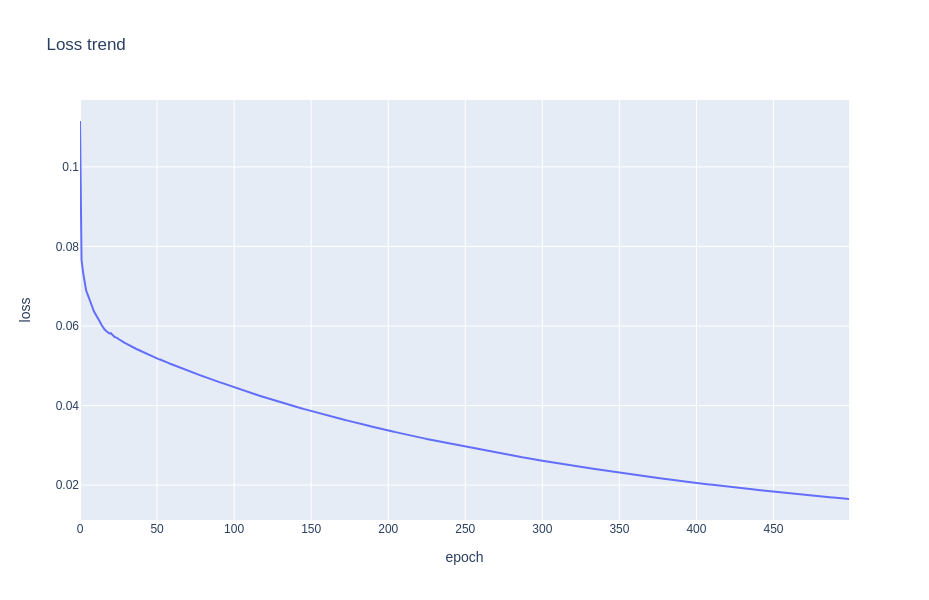

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(y=history['loss'],
                    mode='lines', name='train'))
if 'val_loss' in history:
    fig.add_trace(go.Scatter(y=history['val_loss'],
                    mode='lines', name='validation'))
fig.update_layout(title='Loss trend',
                  xaxis_title='epoch',
                  yaxis_title='loss',
                  width=1400,
                  height=600)
fig.show()

In [ ]:
train_predictions = model.predict(train_x)

train_y = y_norm.denormalize(train_y)
train_predictions = y_norm.denormalize(train_predictions)

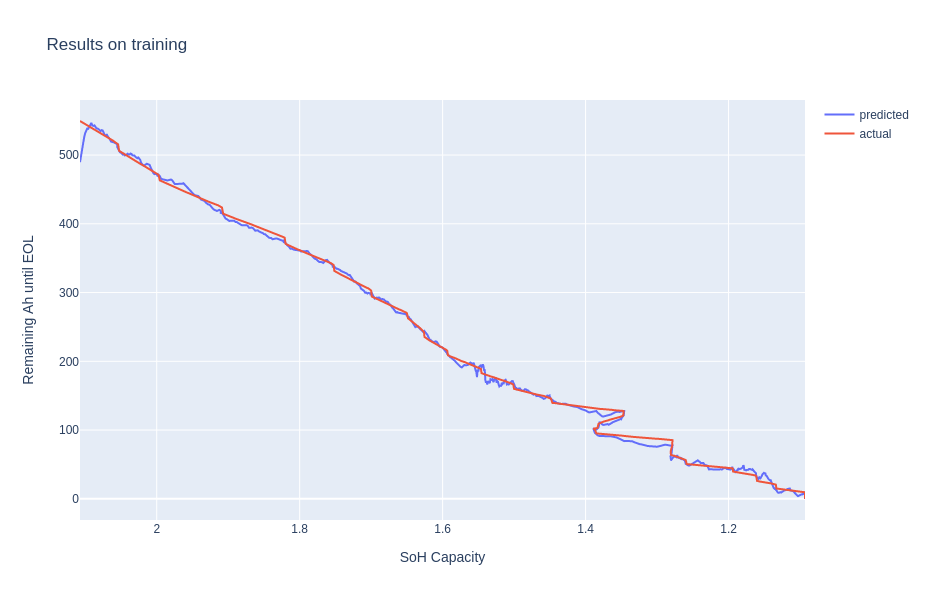

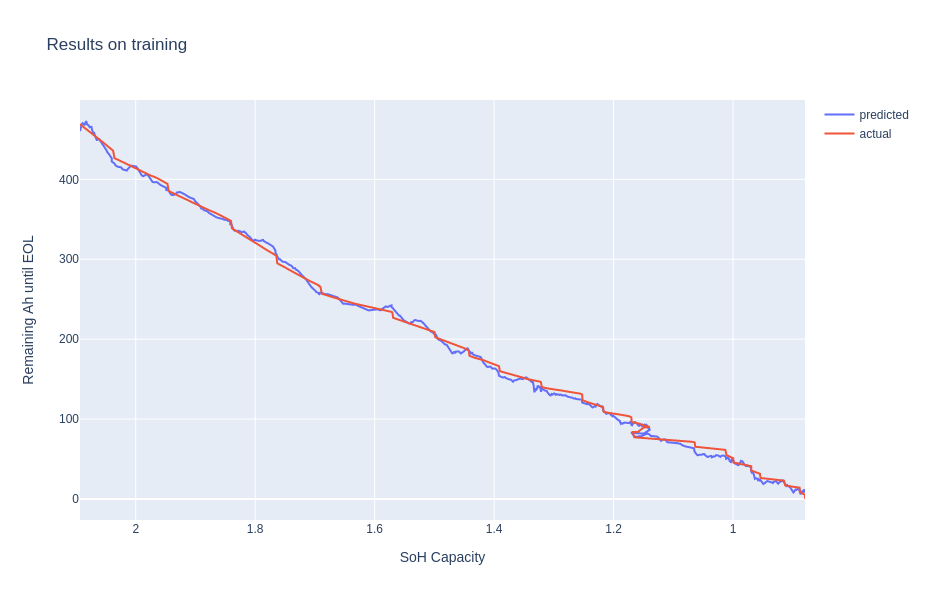

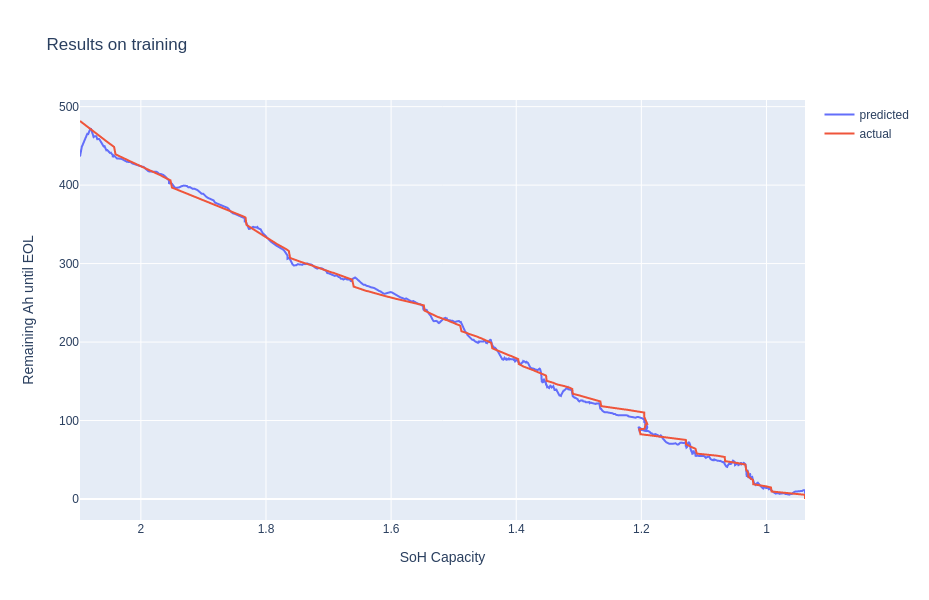

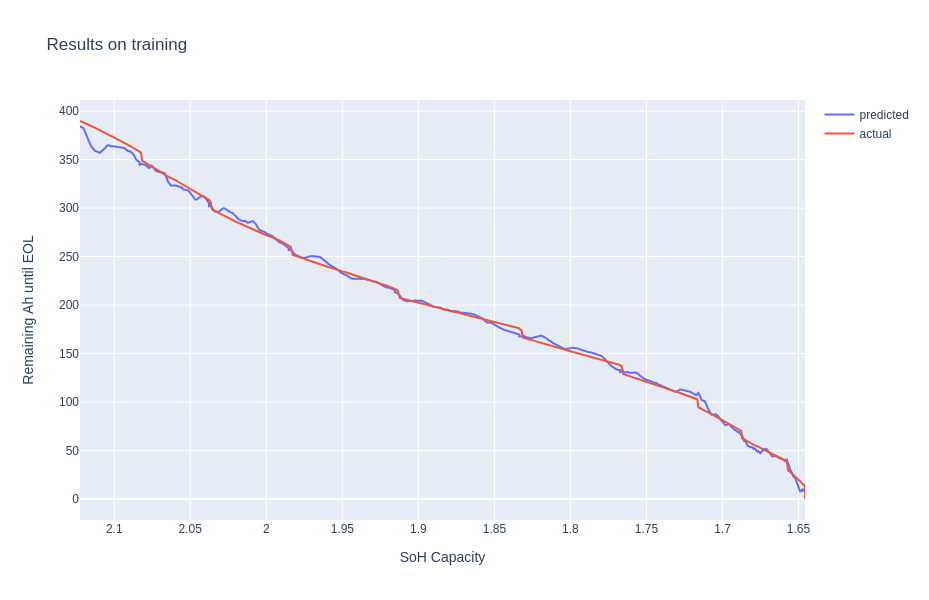

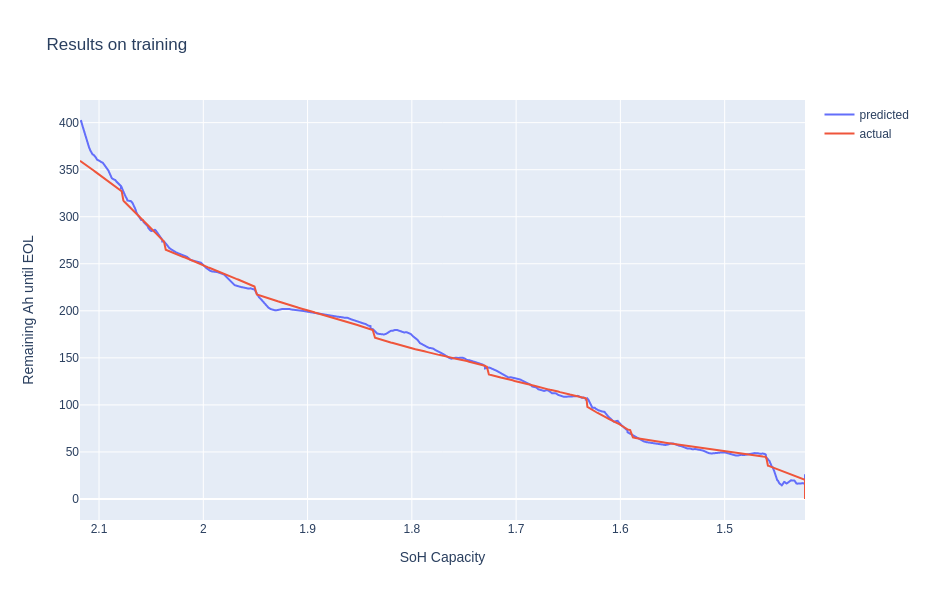

...

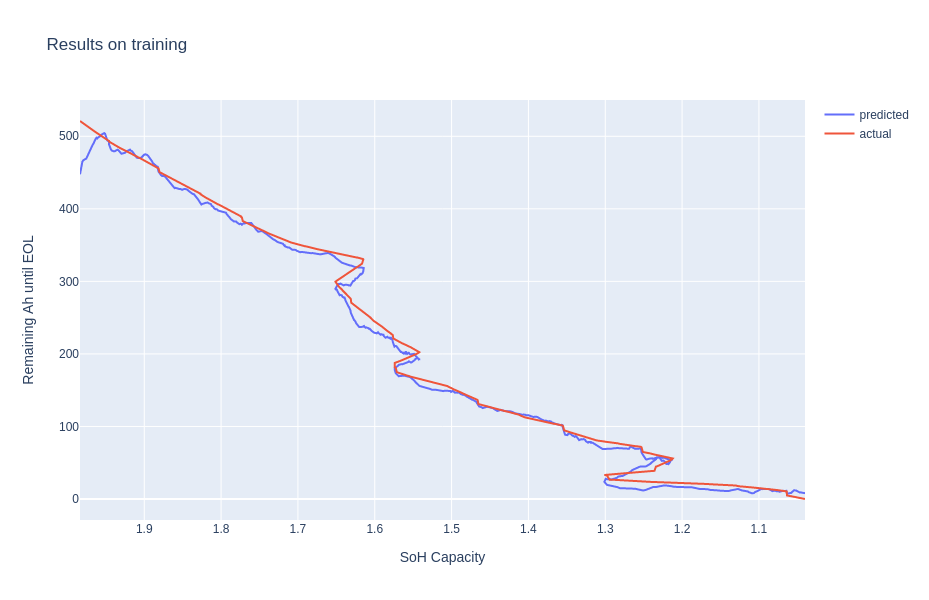

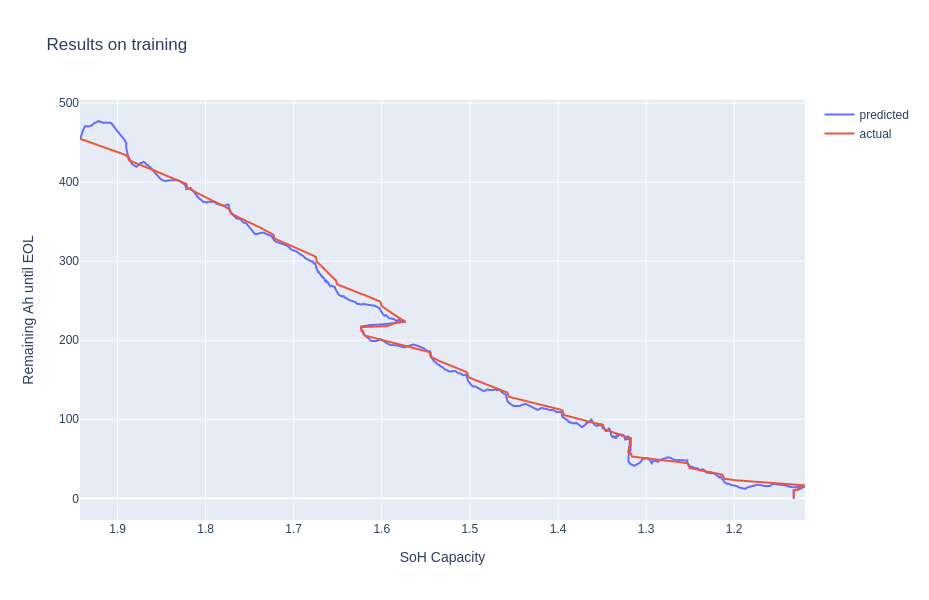

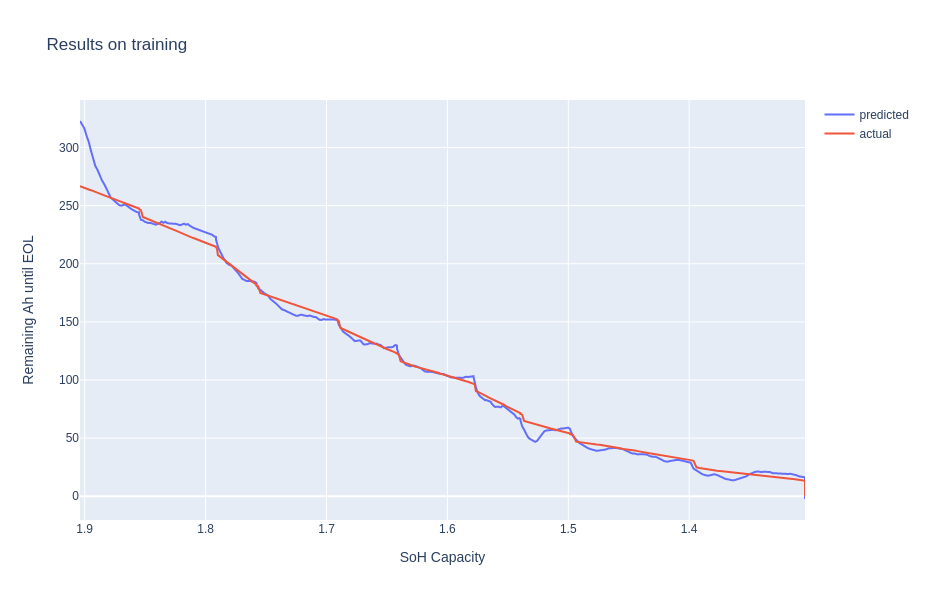

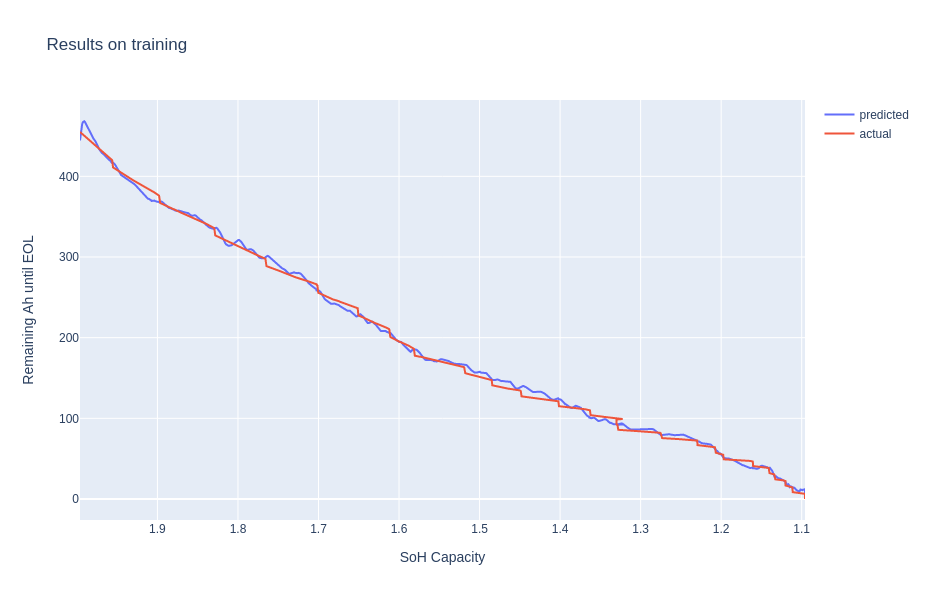

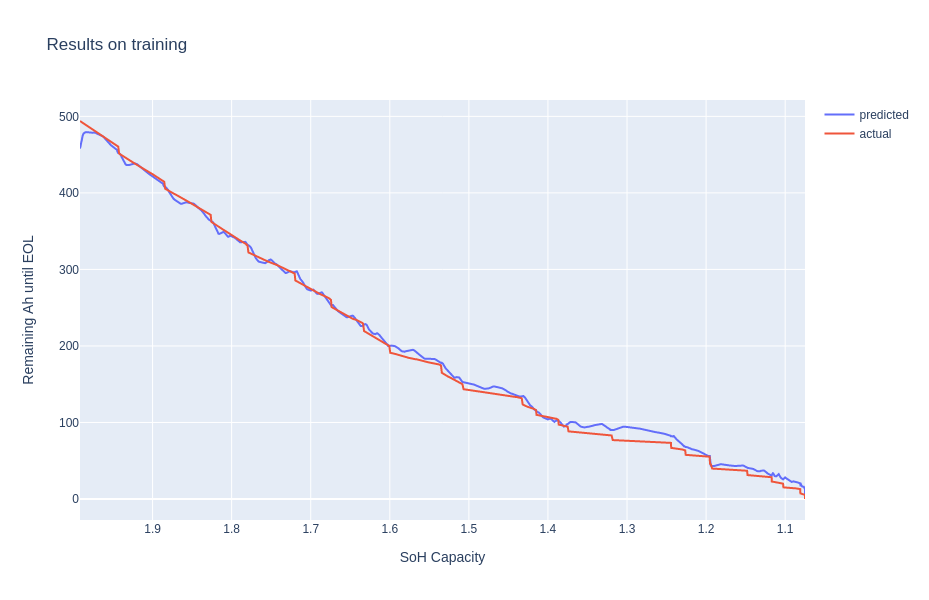

In [ ]:
a = 0
for b in train_battery_range:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train_y_soh[a:b], y=train_predictions[a:b,0],
                        mode='lines', name='predicted'))
    fig.add_trace(go.Scatter(x=train_y_soh[a:b], y=train_y[a:b],
                        mode='lines', name='actual'))
    fig.update_layout(title='Results on training',
                    xaxis_title='SoH Capacity',
                    yaxis_title='Remaining Ah until EOL',
                    xaxis={'autorange':'reversed'},
                    width=1400,
                    height=600)
    fig.show()
    a = b

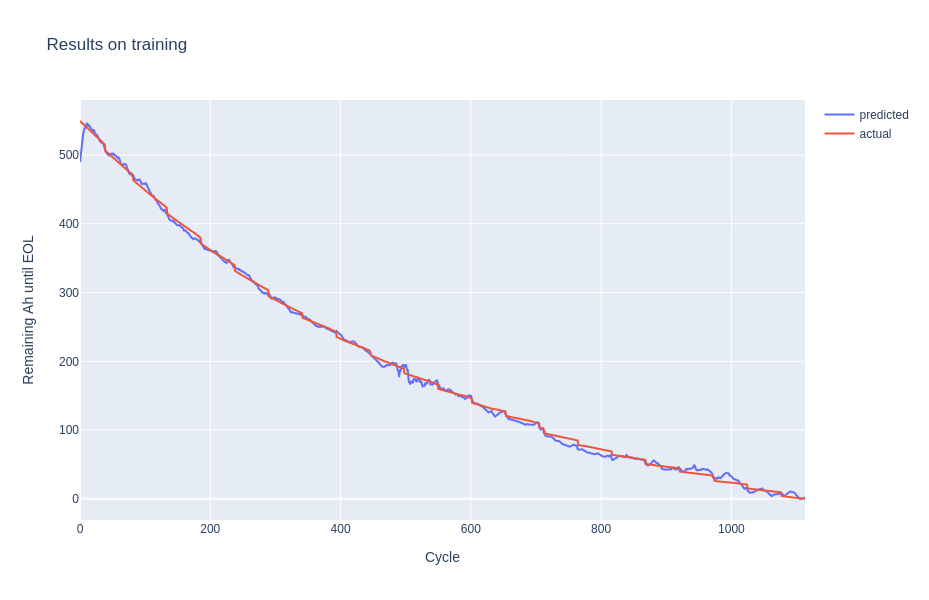

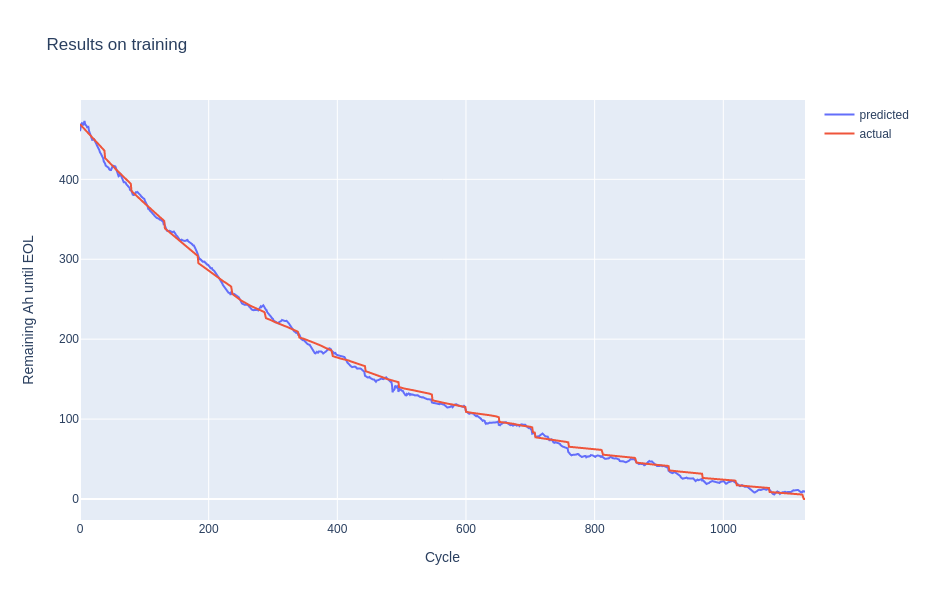

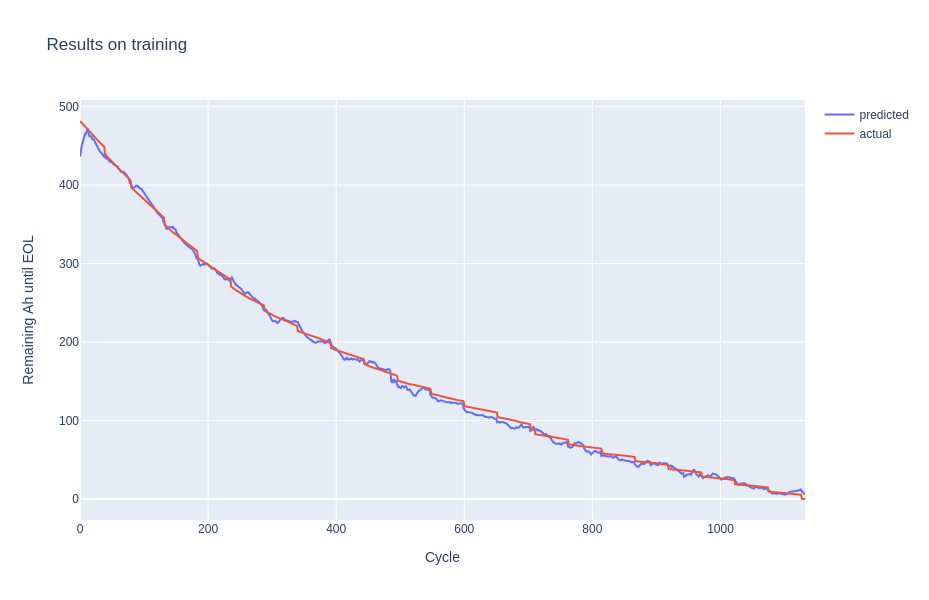

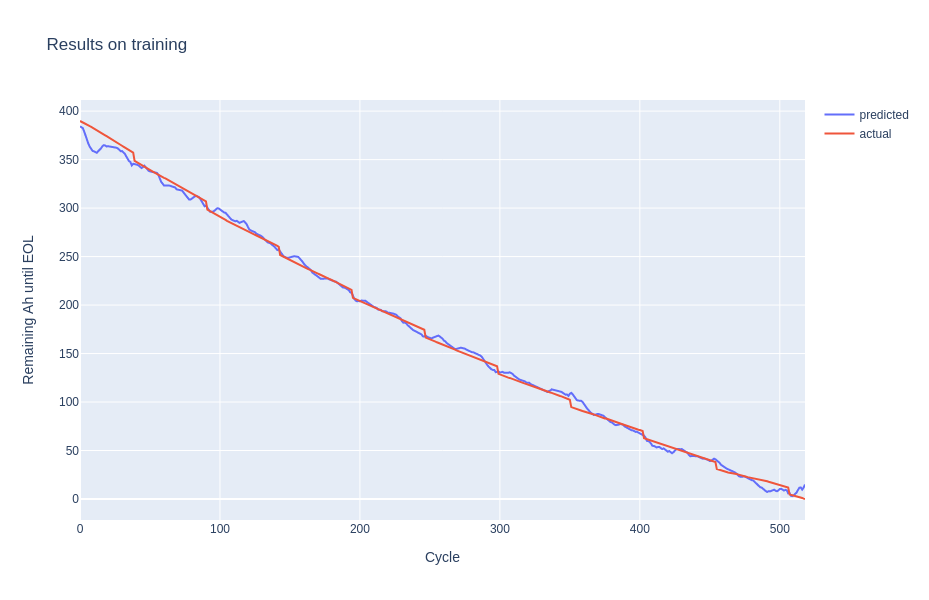

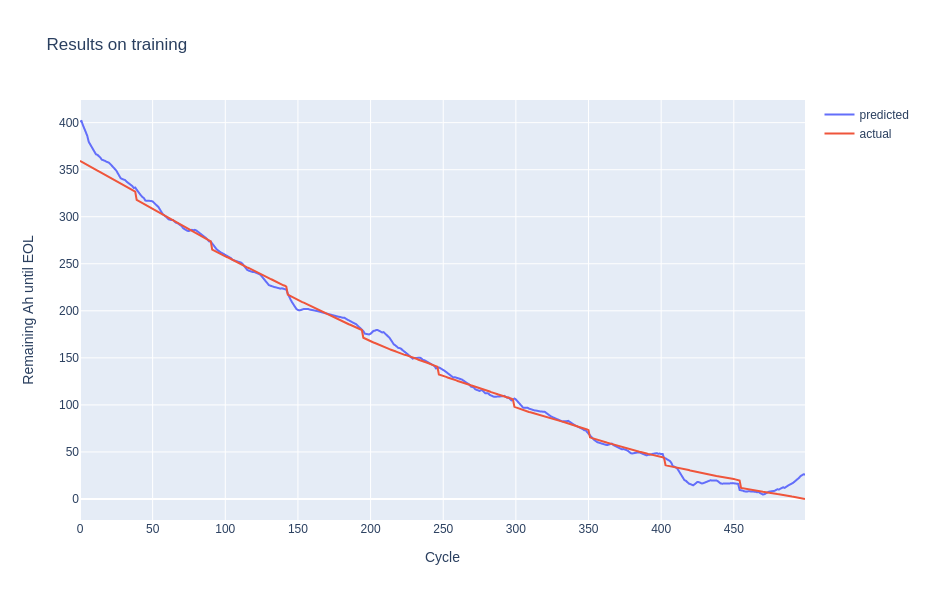

...

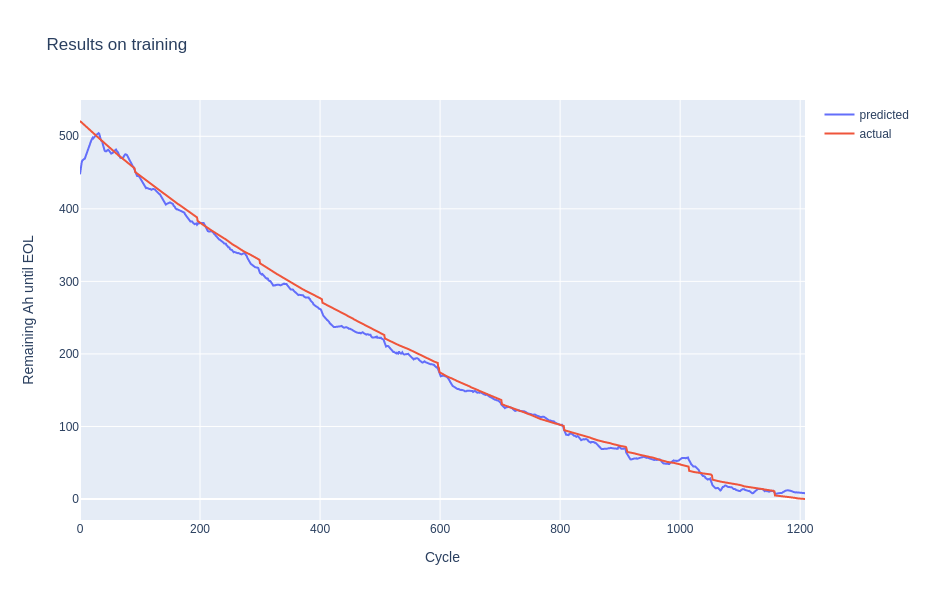

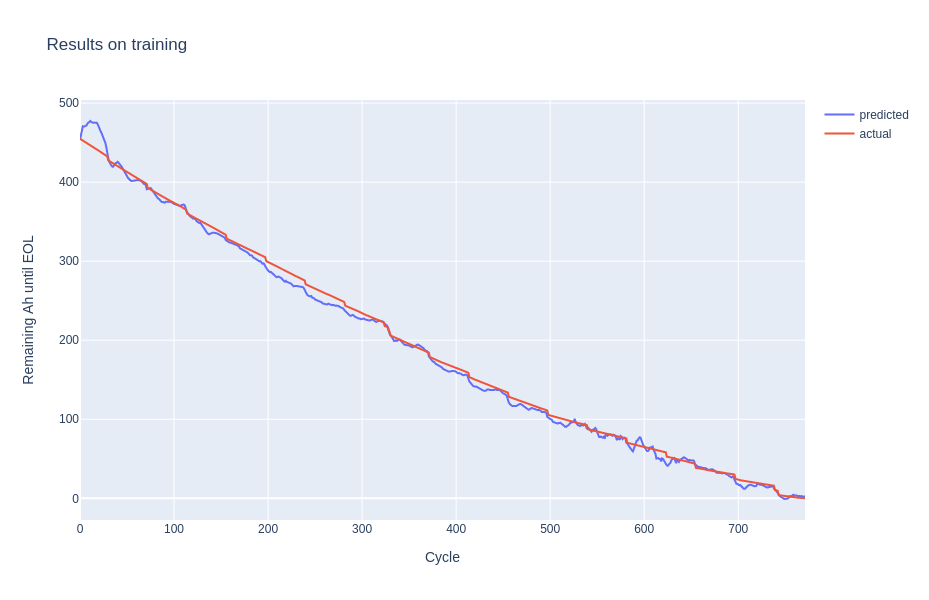

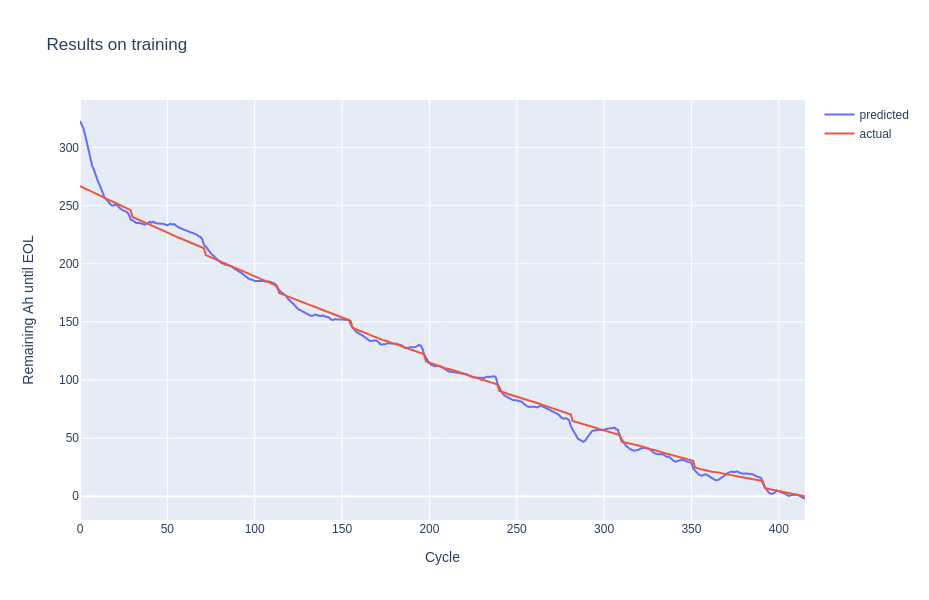

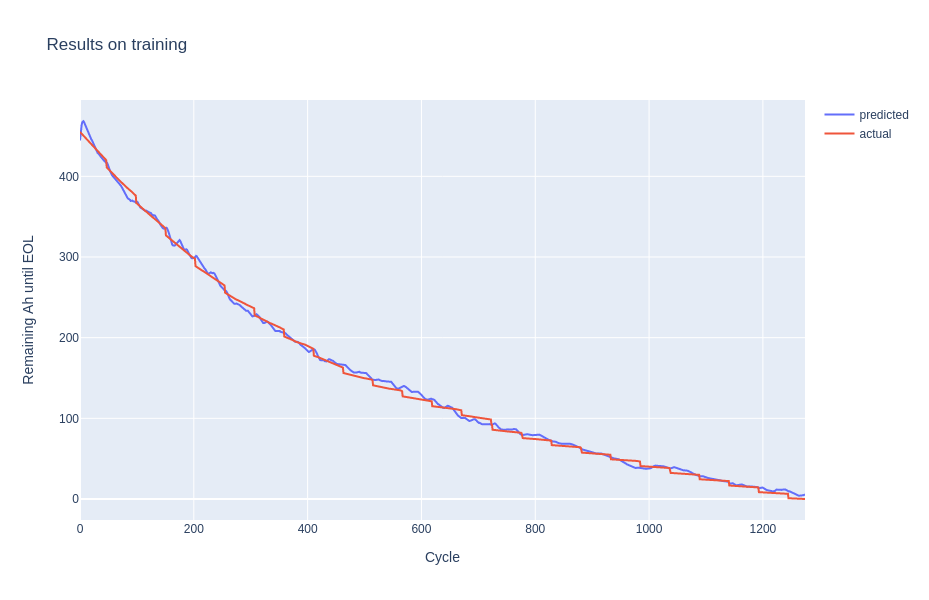

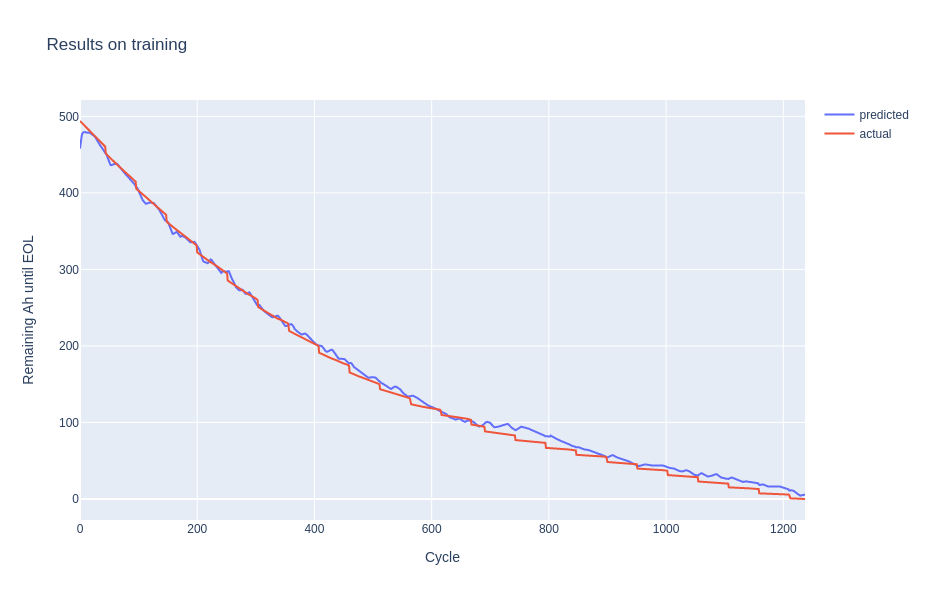

In [ ]:
a = 0
for b in train_battery_range:
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=train_predictions[a:b,0],
                        mode='lines', name='predicted'))
    fig.add_trace(go.Scatter(y=train_y[a:b],
                        mode='lines', name='actual'))
    fig.update_layout(title='Results on training',
                    xaxis_title='Cycle',
                    yaxis_title='Remaining Ah until EOL',
                    width=1400,
                    height=600)
    fig.show()
    a = b

In [ ]:
test_predictions = model.predict(test_x)

test_y = y_norm.denormalize(test_y)
test_predictions = y_norm.denormalize(test_predictions)

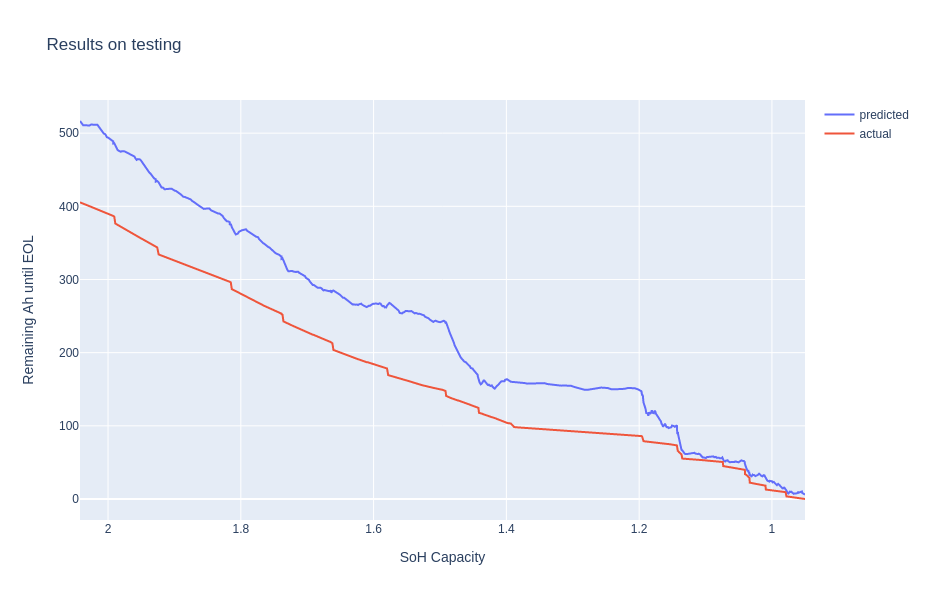

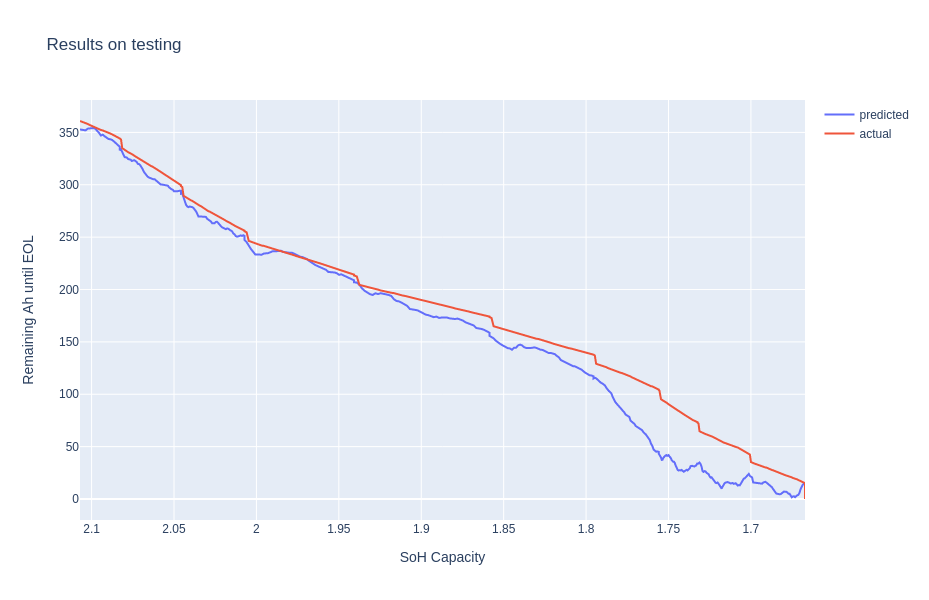

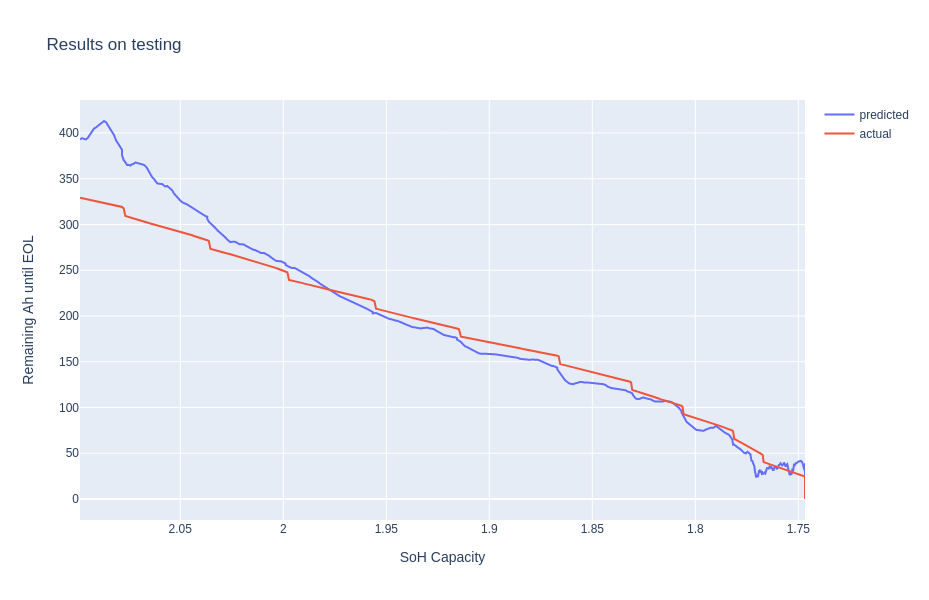

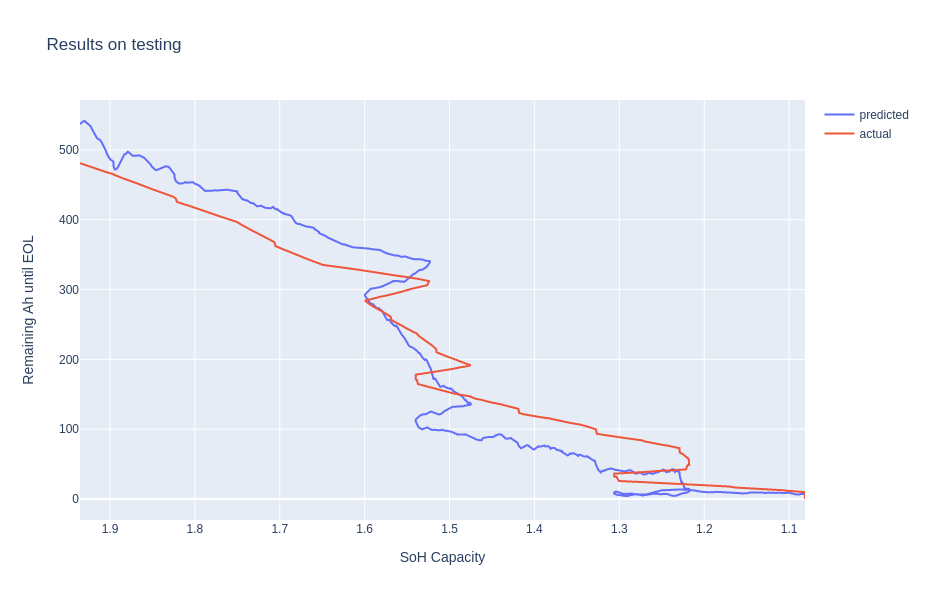

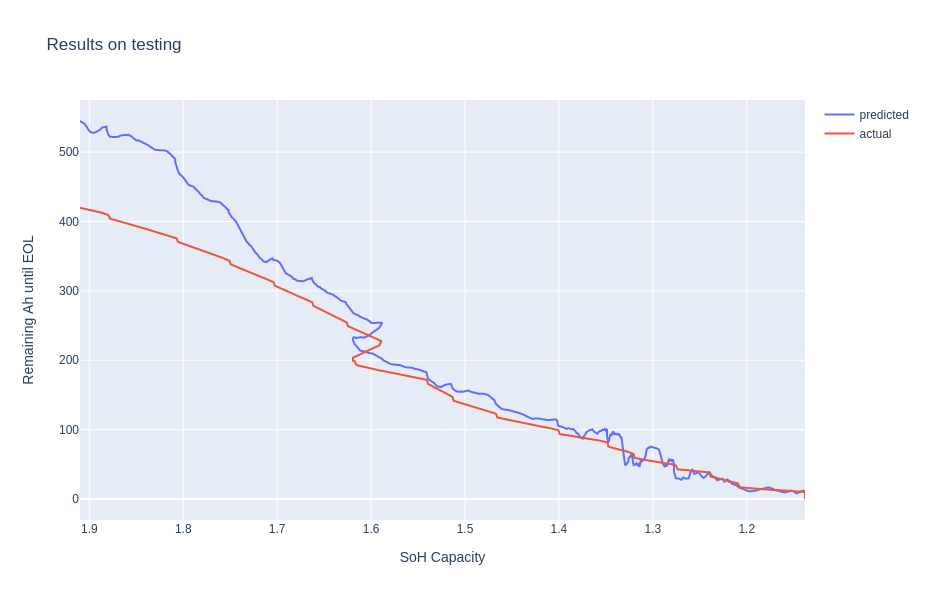

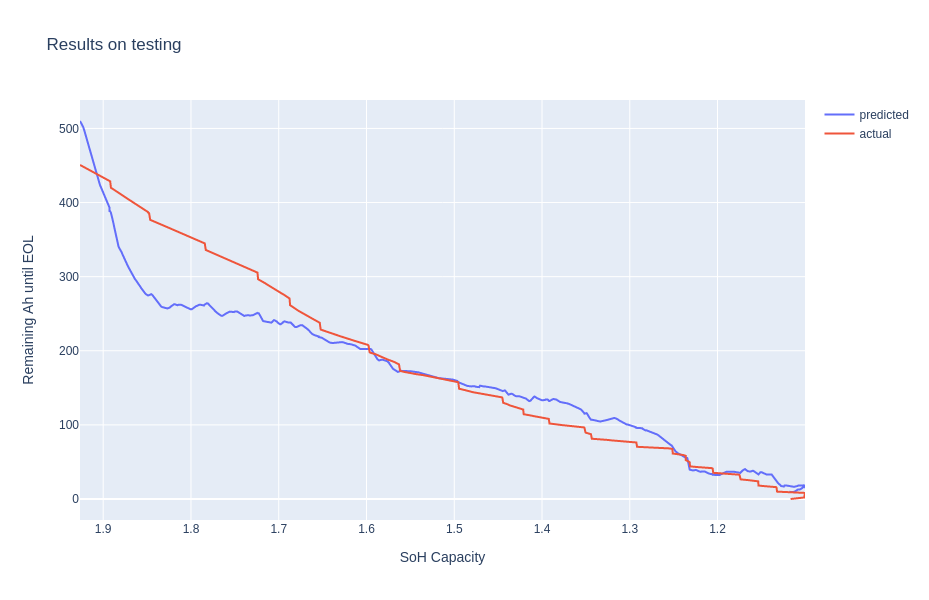

In [ ]:
a = 0
for b in test_battery_range:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=test_y_soh[a:b], y=test_predictions[a:b,0],
                        mode='lines', name='predicted'))
    fig.add_trace(go.Scatter(x = test_y_soh[a:b], y=test_y[a:b],
                        mode='lines', name='actual'))
    fig.update_layout(title='Results on testing',
                    xaxis_title='SoH Capacity',
                    yaxis_title='Remaining Ah until EOL',
                    xaxis={'autorange':'reversed'},
                    width=1400,
                    height=600)
    fig.show()
    a = b

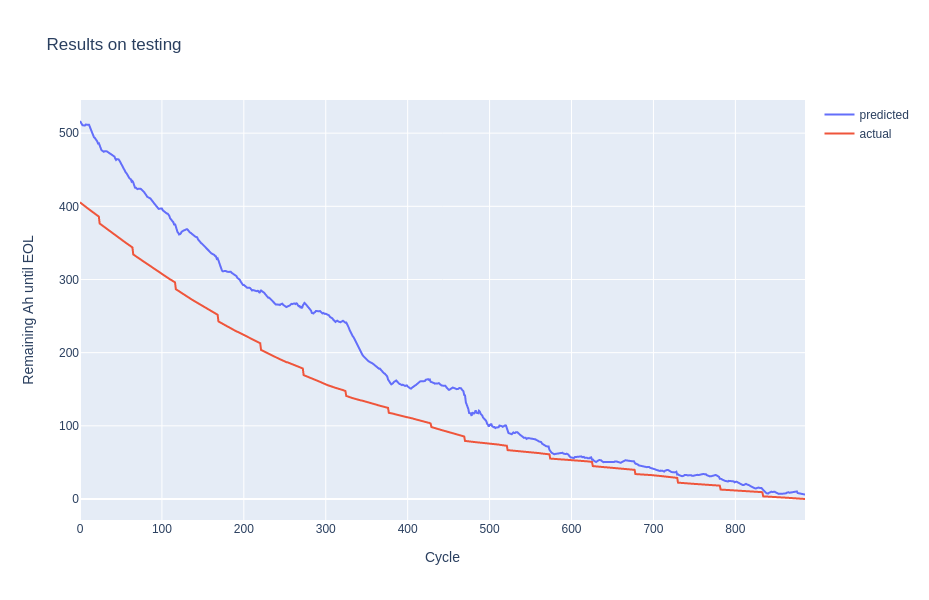

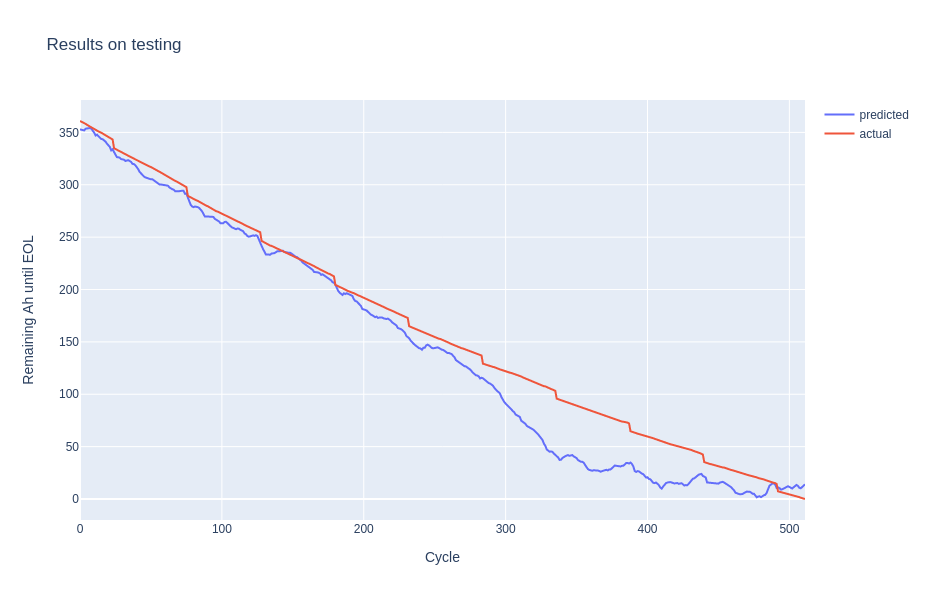

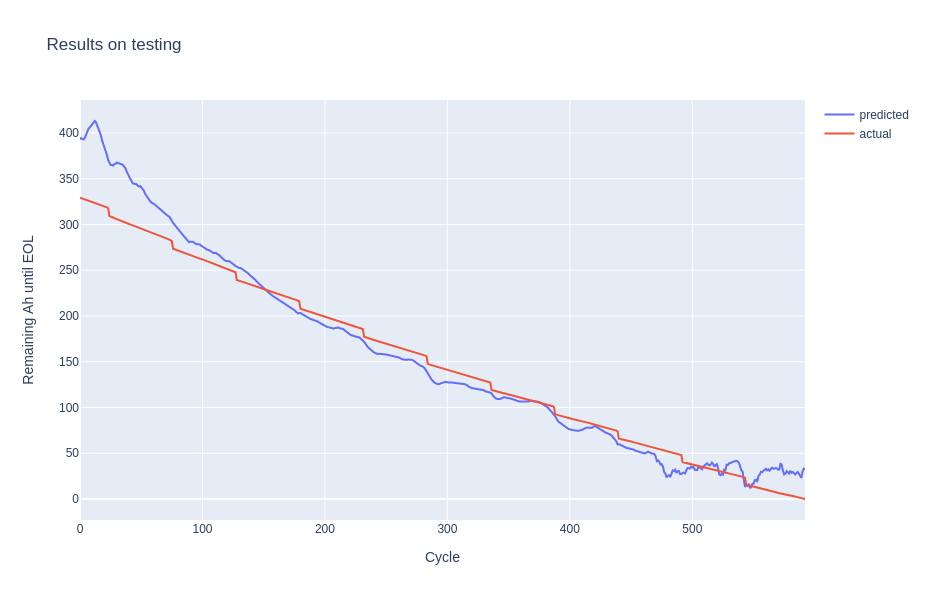

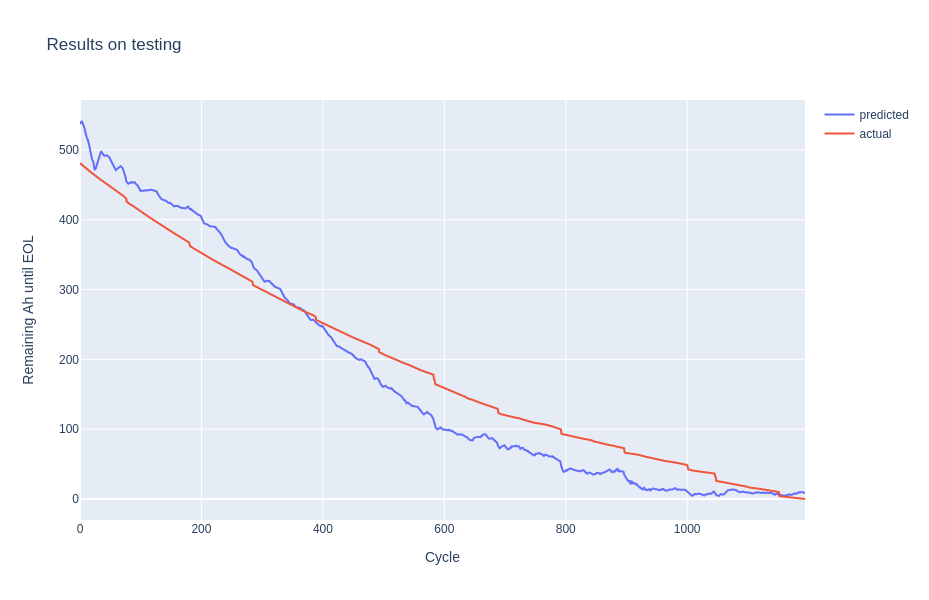

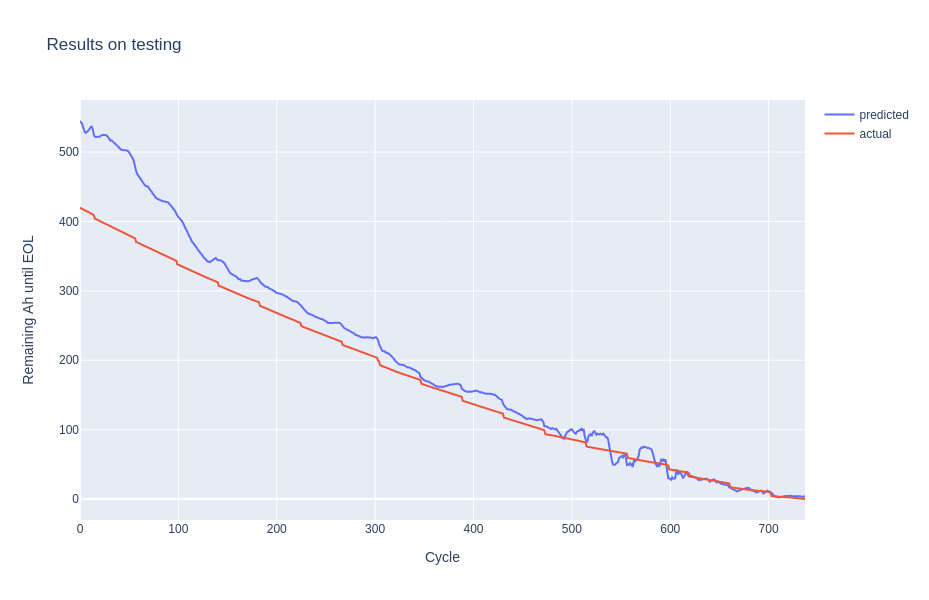

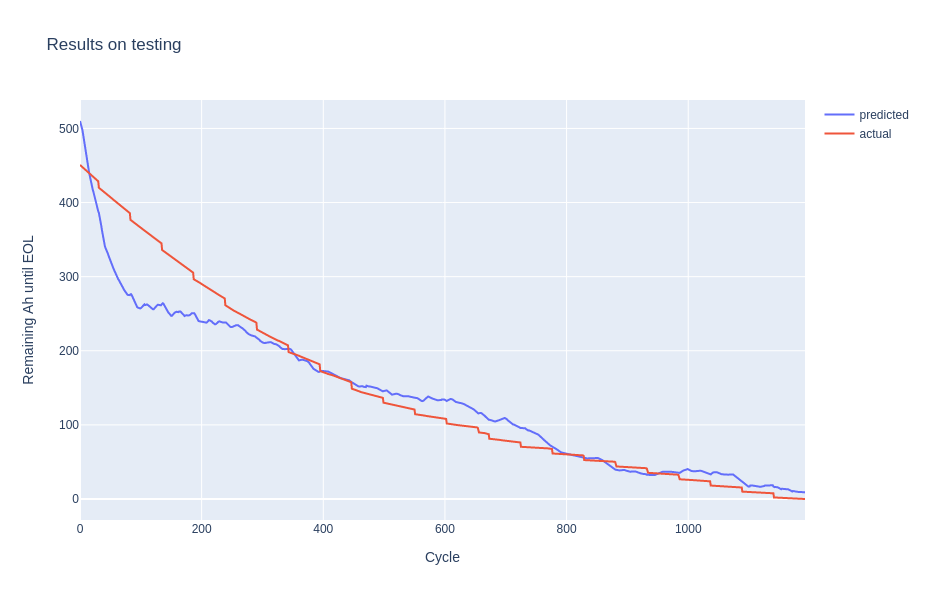

In [ ]:
a = 0
for b in test_battery_range:
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=test_predictions[a:b, 0],
                        mode='lines', name='predicted'))
    fig.add_trace(go.Scatter(y=test_y[a:b],
                        mode='lines', name='actual'))
    fig.update_layout(title='Results on testing',
                    xaxis_title='Cycle',
                    yaxis_title='Remaining Ah until EOL',
                    width=1400,
                    height=600)
    fig.show()
    a = b